# **Analysis of Parse sgPsip1 vs sgSafe**
Samples have been processed for unspliced transcripts

# Import data
Import packages and prepare workspace

In [1]:
import numpy as np
import scanpy as sc
import seaborn as sns
import pandas as pd
import anndata as ad
import decoupler as dc
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, dpi_save = 300, figsize = (5,4), transparent=True, format = 'pdf')

In [2]:
data_path = '/Volumes/G_DRIVE_SSD/Parse_WT/split_pipe_output/combined_output/all_libs/combined_output/all-well/DGE_filtered/'

## Load h5ad file created from Parse script 
This file include the unspliced reads.  Afterward we're reading in the combined cell metadata file in the original analsyis that contains the sample information from the output of the "all-well" sample. This file is located in the `DGE_filtered` folder in the `all-well` sample folder. This combined metadata file is obtatined after running `split-pipe --mode comb` and will allow us to find the exact barcodes that correspond both anndata objects.

In [3]:
# The DGE_filtered folder contains the expression matrix, genes, and files
# NOTE: split-pipe versions older than 1.1.0 used 'DGE.mtx'
adata = sc.read_mtx(data_path + 'DGE.mtx')

# reading in gene and cell data
gene_data = pd.read_csv(data_path + 'all_genes.csv')
cell_meta = pd.read_csv(data_path + 'cell_metadata.csv')

# find genes with nan values and filter
gene_data = gene_data[gene_data.gene_name.notnull()]
notNa = gene_data.index
notNa = notNa.to_list()

# remove genes with nan values and assign gene names
adata = adata[:,notNa]
adata.var = gene_data
adata.var.set_index('gene_name', inplace=True)
adata.var.index.name = None
adata.var_names_make_unique()

# add cell meta data to anndata object
adata.obs = cell_meta
adata.obs.set_index('bc_wells', inplace=True)
adata.obs.index.name = None
adata.obs_names_make_unique()

sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=5)

# Returns the dimensions of the expression matrix (cells, genes)
adata.shape

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/anndata/_core/anndata.py:788: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


(78719, 33802)

# Select samples for analysis
## Analyzing sgPsip1 vs sgSafes

In [5]:
adata = adata[adata.obs['sample'].isin(["sgPsip1_MT2131","sgPsip1_MT2140","sgPsip1_MT2166","sgSafe14_MT2110","sgSafe14_MT2144", "sgSafe14_MT2179", "sgSafe14_MT2179_2"])]
adata.obs['sample'].value_counts()

sgPsip1_MT2166       9213
sgSafe14_MT2110      5551
sgSafe14_MT2144      5420
sgPsip1_MT2140       3893
sgPsip1_MT2131       2476
sgSafe14_MT2179       871
sgSafe14_MT2179_2     412
Name: sample, dtype: int64

# QC and filter low quality cells
following https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering-2017.html

## QC Metrics

In [6]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^Hb[^(p)]"))

/var/folders/zd/n88znlnj3gj1cs4q1qk295xr0000gn/T/ipykernel_50827/1376095374.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith("mt-")


In [7]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)
adata

AnnData object with n_obs × n_vars = 27836 × 33802
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_id', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

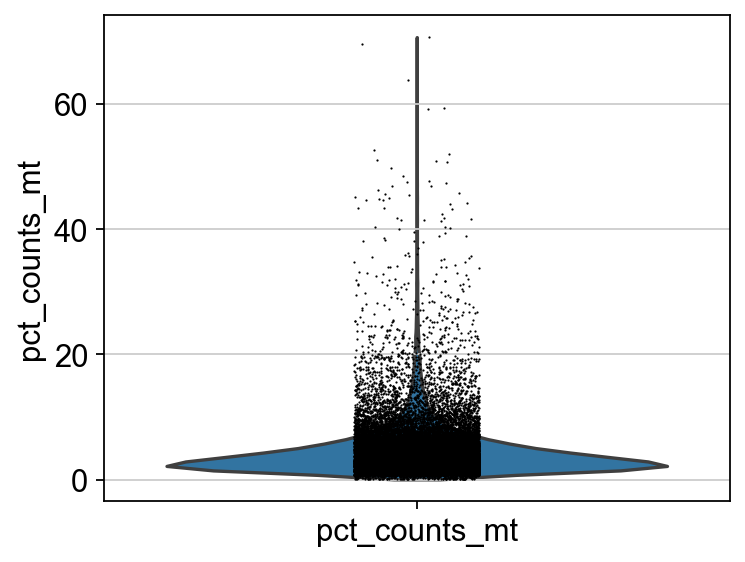

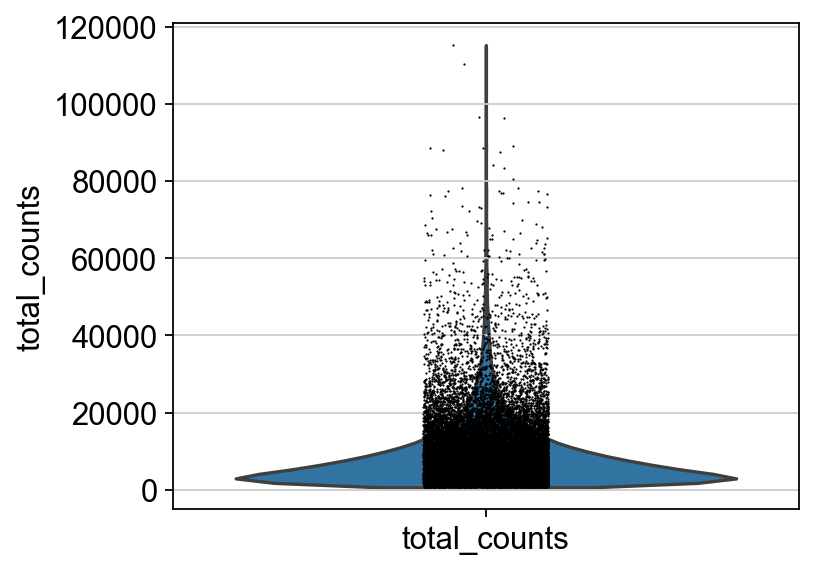

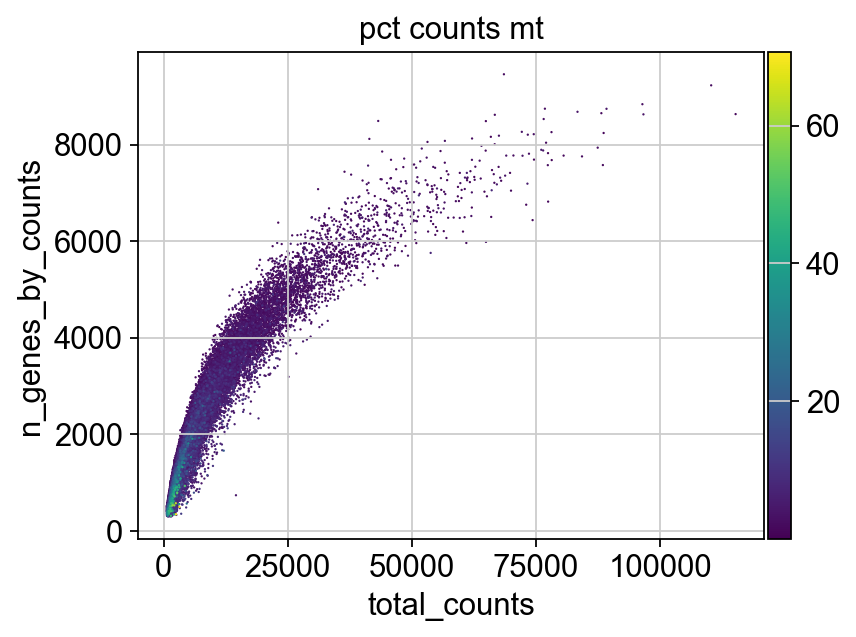

In [8]:
# sns.displot(adata.obs["total_counts"], bins=100, kde=False)
sc.pl.violin(adata, "pct_counts_mt", ylabel="pct_counts_mt")
sc.pl.violin(adata, "total_counts", ylabel="total_counts")
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

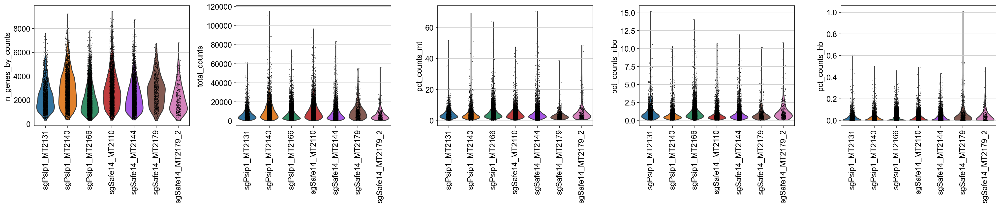

In [9]:
p4 = sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'], groupby = 'sample', rotation= 90)

## Filter

In [10]:
# Filter the data
adata = adata[adata.obs.n_genes_by_counts < 6000,:]
adata = adata[adata.obs.total_counts < 40000,:]
adata = adata[adata.obs.pct_counts_mt < 10,:]

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Number of cells after filtering of low quality cells: 25436


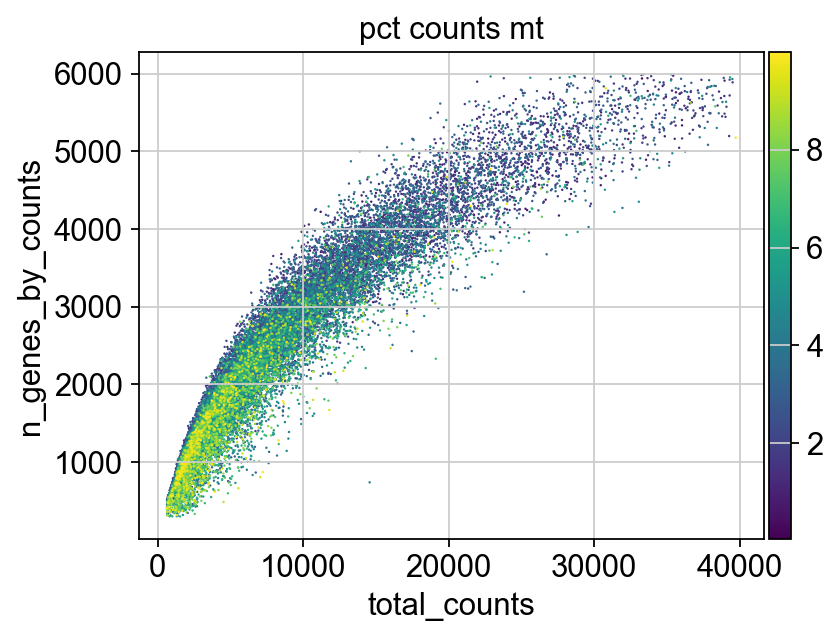

In [11]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

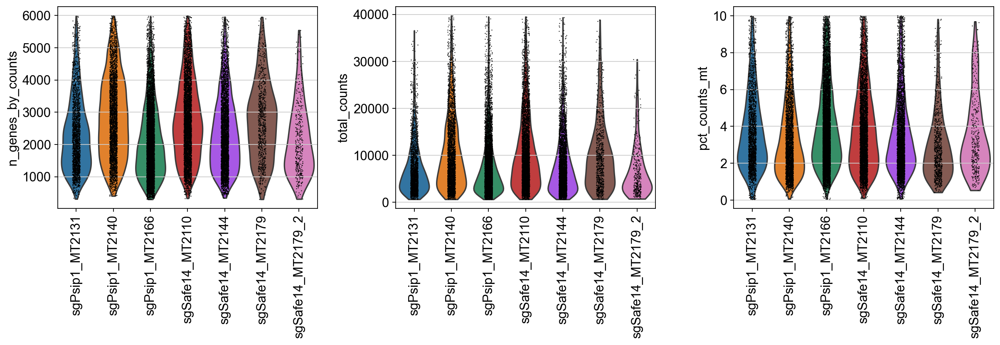

In [12]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], groupby = 'sample', rotation= 90)

## Doublet Detection
citation https://www.sciencedirect.com/science/article/pii/S2405471218304745

In [13]:
import scrublet as scr

In [14]:
scrub = scr.Scrublet(adata.X, expected_doublet_rate = 0.075)

In [15]:
adata.obs['doublet_scores'], adata.obs['predicted_doublets']  = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.81
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 7.5%
	Estimated  = 0.0%
Elapsed time: 45.0 seconds


/var/folders/zd/n88znlnj3gj1cs4q1qk295xr0000gn/T/ipykernel_50827/54558675.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_scores'], adata.obs['predicted_doublets']  = scrub.scrub_doublets()


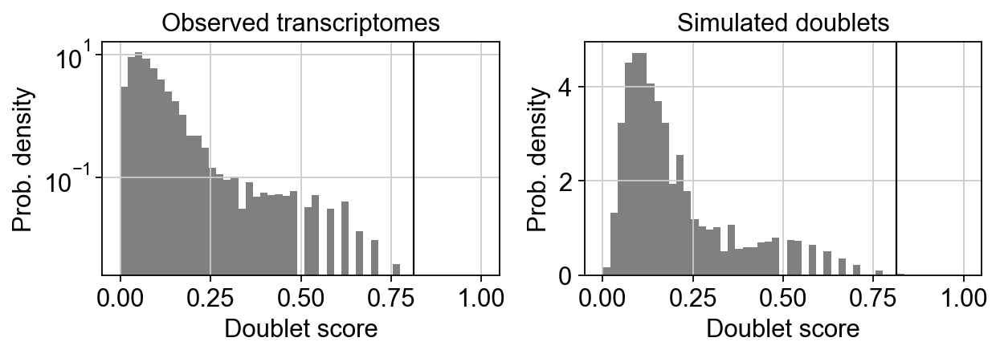

In [16]:
%matplotlib inline
p8 = scrub.plot_histogram()

In [17]:
print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))

# # Uncomment to run tSNE - slow
# print('Running tSNE...')
# scrub.set_embedding('tSNE', scr.get_tsne(scrub.manifold_obs_, angle=0.9))

# # Uncomment to run force layout - slow
# print('Running ForceAtlas2...')
# scrub.set_embedding('FA', scr.get_force_layout(scrub.manifold_obs_, n_neighbors=5. n_iter=1000))
    
print('Done.')

Running UMAP...


/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/p

Done.


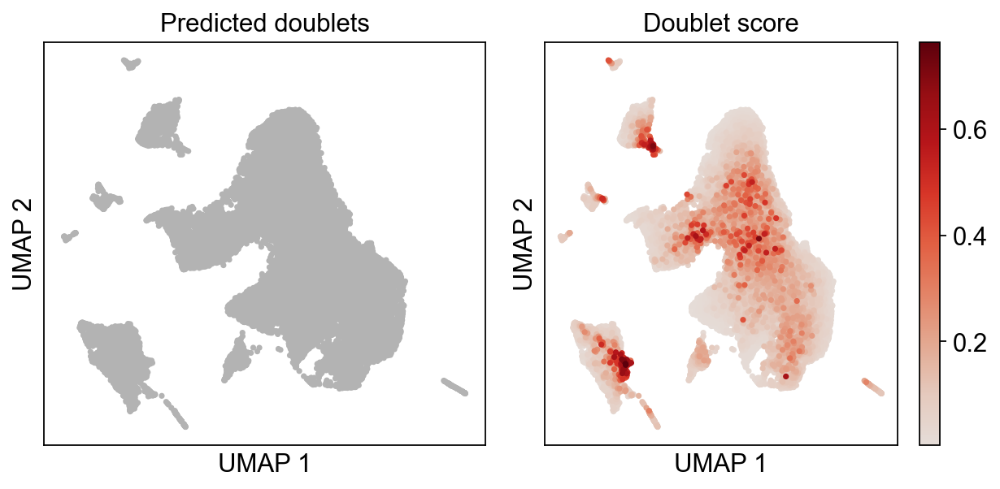

In [18]:
p9 = scrub.plot_embedding('UMAP', order_points=True);

# scrub.plot_embedding('tSNE', order_points=True);
# scrub.plot_embedding('FA', order_points=True);

In [19]:
adata.obs['predicted_doublets'].value_counts()

False    25436
Name: predicted_doublets, dtype: int64

In [20]:
# filter doublets
adata = adata[~adata.obs['predicted_doublets']]

In [21]:
adata

View of AnnData object with n_obs × n_vars = 25436 × 33802
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_scores', 'predicted_doublets'
    var: 'gene_id', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors'

In [22]:
adata.obs["Genotype"] = adata.obs['sample'].apply(lambda x:x.split('_')[0])

/var/folders/zd/n88znlnj3gj1cs4q1qk295xr0000gn/T/ipykernel_50827/3935425041.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Genotype"] = adata.obs['sample'].apply(lambda x:x.split('_')[0])


# Normalization
https://nbisweden.github.io/workshop-scRNAseq/labs/scanpy/scanpy_02_dimred.html

In [23]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

# store normalized counts in the raw slot, 
# we will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata

adata

AnnData object with n_obs × n_vars = 25436 × 33802
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_scores', 'predicted_doublets', 'Genotype'
    var: 'gene_id', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sample_colors', 'log1p'
    layers: 'counts'

import scipy.sparse

# Get raw counts from adata.layers or adata.raw.X
counts = adata.layers['counts']  # or counts = adata.raw.X

# Convert sparse matrix to dense if necessary
counts_array = counts.toarray() if scipy.sparse.issparse(counts) else counts

# Create DataFrame
counts_df = pd.DataFrame(
    counts_array,
    index=adata.obs_names,
    columns=adata.var_names
)

# Add metadata
counts_df['sample'] = adata.obs['sample'].values
counts_df['Genotype'] = adata.obs['Genotype'].values

# Feature Selection

Highly variable genes: 4557


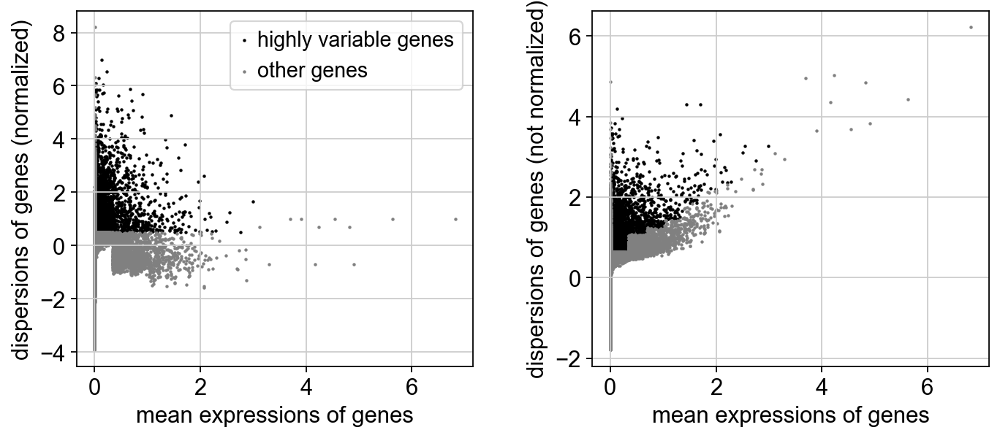

In [24]:
# compute variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(adata)

# subset for variable genes in the dataset
adata = adata[:, adata.var['highly_variable']]

In [25]:
#run this line if you get the "AttributeError: swapaxes not found" 
# adata = adata.copy()

# regress out unwanted variables
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

# scale data, clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


# PCA

In [26]:
sc.tl.pca(adata, svd_solver='arpack')

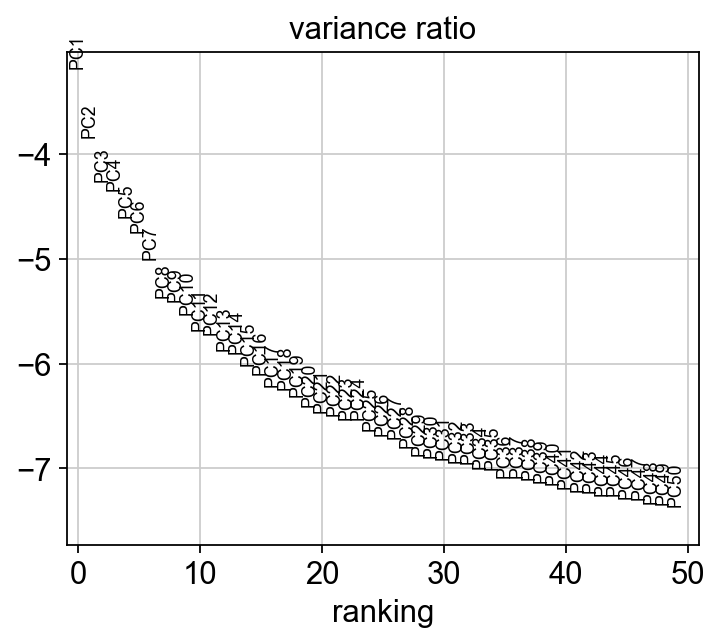

In [27]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

# Clustering and UMAP

In [28]:
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 20)

In [29]:
sc.tl.umap(adata)

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


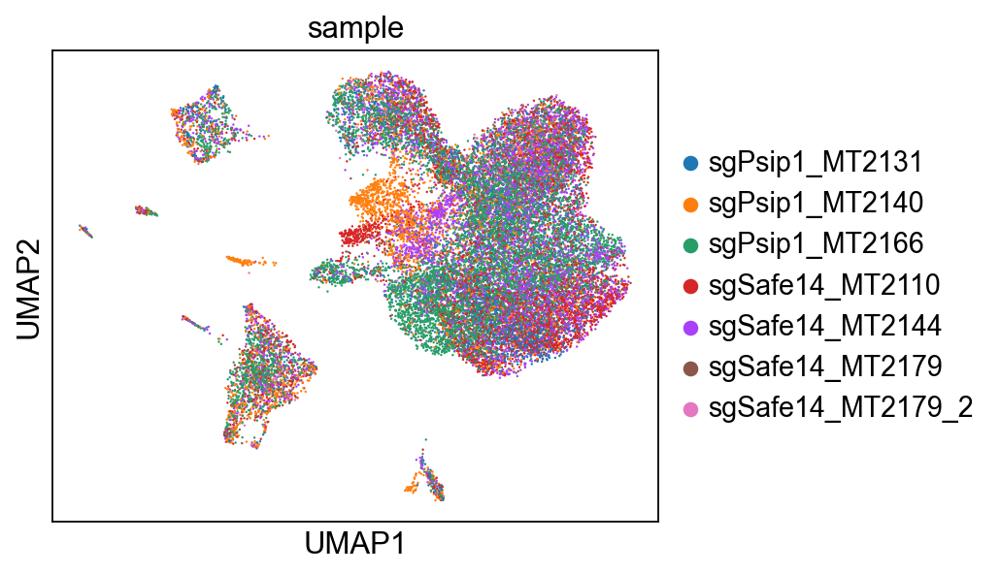

In [30]:
sc.pl.umap(adata,color="sample")

In [31]:
sc.tl.leiden(adata, resolution = 0.25, key_added = "leiden_0.25")
sc.tl.leiden(adata, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(adata, resolution = 1.0,key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 1.5, key_added = "leiden_1.5")

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/sca

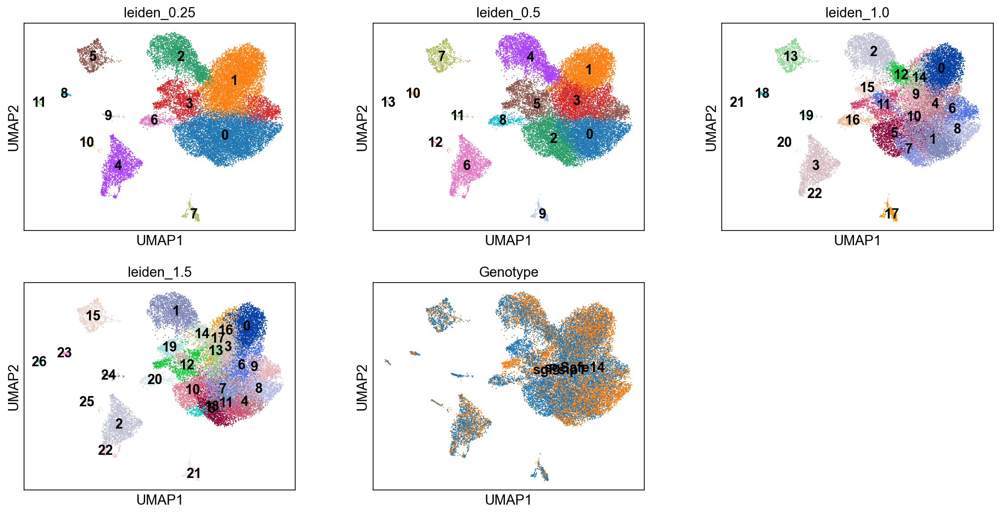

In [32]:
sc.pl.umap(adata, color=['leiden_0.25', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'Genotype'], ncols = 3, legend_loc = 'on data')

# Identify TME clusters

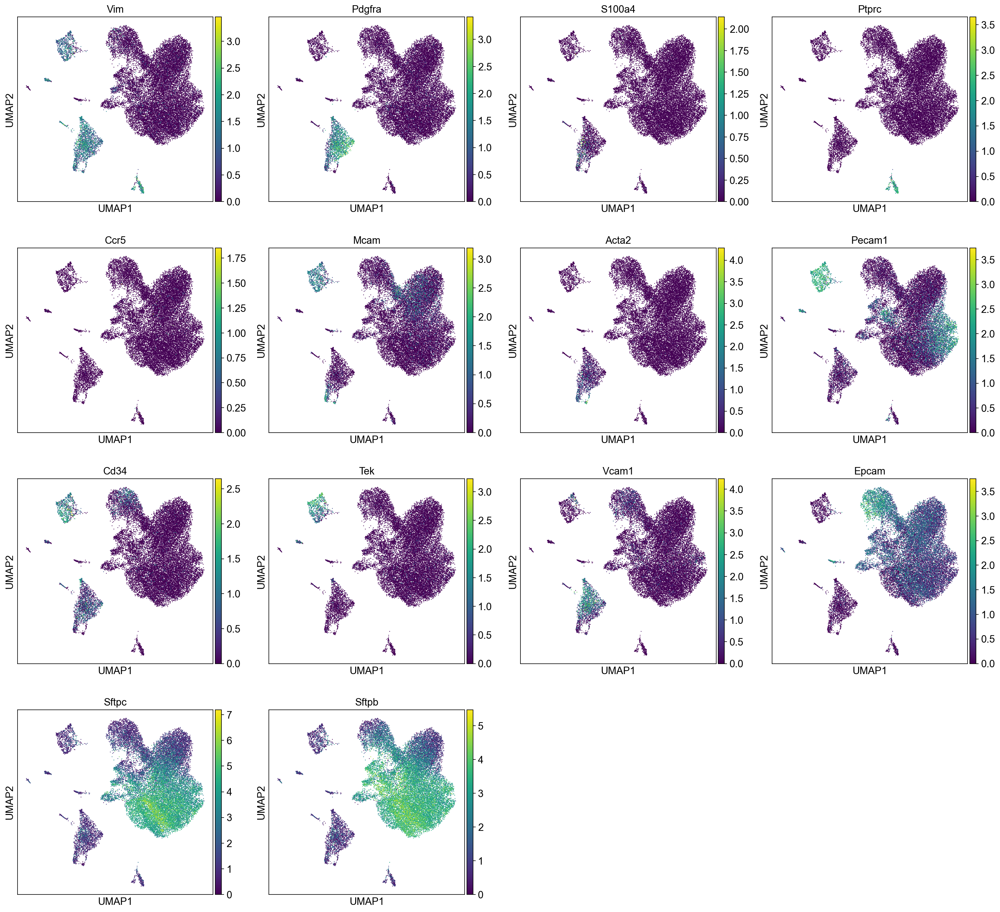

In [33]:
tme_markers  = ["Vim", "Pdgfra","S100a4", "Ptprc", "Ccr5", "Mcam", "Acta2", "Pecam1", "Cd34", "Tek","Vcam1","Epcam", "Sftpc", "Sftpb"]
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color=tme_markers, save = 'sgPsip1_tme')

In [34]:
tme = ['21','22','23','24','25','26','15','2']

In [35]:
adata.obs['cell_type'] = adata.obs['leiden_1.5'].map(lambda x:'tme' if x in tme else 'epi')

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


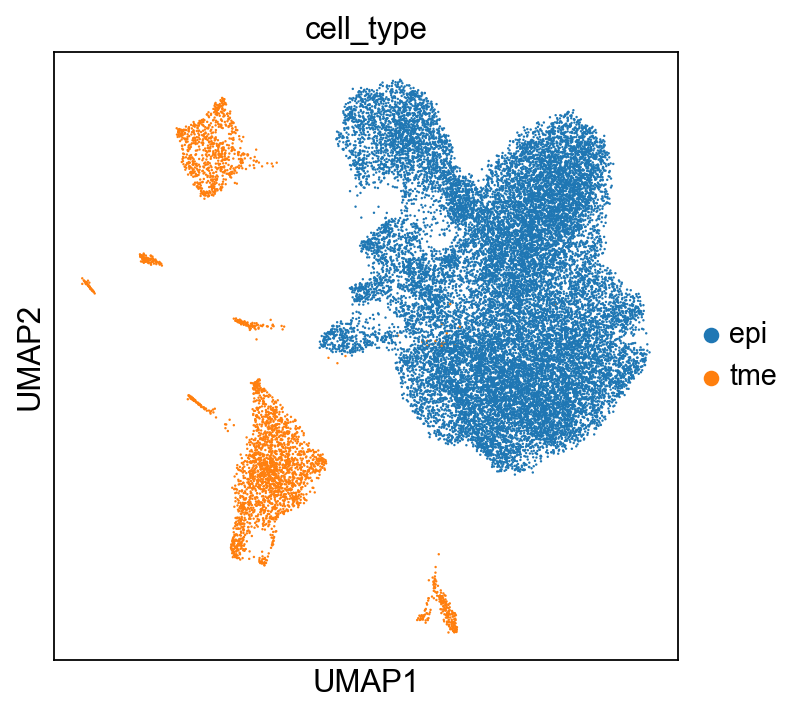

In [36]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='cell_type', save = 'sgPsip1_tme2')

In [37]:
genotype = adata.obs['Genotype']
cell_type = adata.obs['cell_type']
# new column
adata.obs['comp_groups'] = genotype.astype(str) + '_' + cell_type.astype(str)

In [38]:
adata

AnnData object with n_obs × n_vars = 25436 × 4557
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_scores', 'predicted_doublets', 'Genotype', 'leiden_0.25', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'cell_type', 'comp_groups'
    var: 'gene_id', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.25_co

# Subset Clusters

We are only interested in lung epithelial cancer cells, removing all TME clusters

In [39]:
adata_filt = adata[~adata.obs["leiden_1.5"].isin(tme),:]

In [40]:
# Get the cluster labels
cluster_labels = adata.obs['leiden_0.5']

# Count the number of cells in each cluster
cluster_counts = cluster_labels.value_counts()

print(cluster_counts)

0     4749
1     4459
2     3640
3     3348
4     3005
5     2553
6     1998
7      740
8      416
9      215
10      97
11      86
12      77
13      53
Name: leiden_0.5, dtype: int64


/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterp

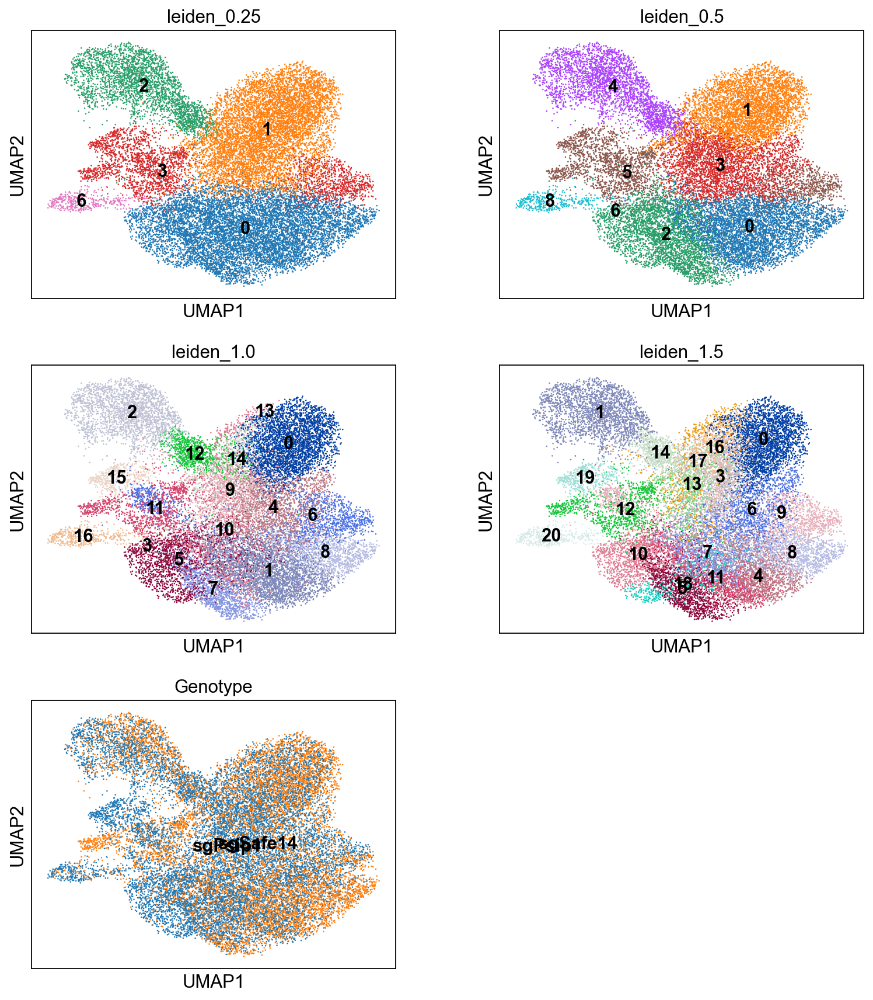

In [41]:
sc.pl.umap(adata_filt, color=["leiden_0.25","leiden_0.5","leiden_1.0","leiden_1.5", "Genotype"], ncols = 2, legend_loc = 'on data')

# Differential gene expression for enriched clusters

In [57]:
# 1. Raw counts of cells per (cluster, genotype)
ct = pd.crosstab(adata_filt.obs['leiden_1.0'], adata_filt.obs['Genotype'])

# 2. Normalize by total number of cells per genotype (columns)
ct_norm = ct.div(ct.sum(axis=0), axis=1)  # divide each column by its sum

# 3. For each cluster, further normalize so the row sums to 1
ct_norm_frac = ct_norm.div(ct_norm.sum(axis=1), axis=0)  # divide each row by its sum

In [58]:
ct_norm_frac_sorted = ct_norm_frac.sort_values('sgPsip1', ascending=True)
ct_norm_frac_sorted

Genotype,sgPsip1,sgSafe14
leiden_1.0,,
11,0.236639,0.763361
8,0.275804,0.724196
0,0.366343,0.633657
1,0.389954,0.610046
7,0.499189,0.500811
2,0.507070,0.492930
14,0.521093,0.478907
10,0.541255,0.458745
4,0.590461,0.409539


In [59]:
adata_filt.obs['Groups'] = "unenriched"

In [60]:
enriched = ct_norm_frac_sorted.loc[ct_norm_frac_sorted['sgPsip1'] > 0.60].index.tolist()
print(enriched)

['9', '6', '16', '5', '15', '3', '13']


In [61]:
adata_filt.obs.loc[adata_filt.obs['leiden_1.0'].isin(enriched), 'Groups'] = 'sgPsip1_enriched'

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


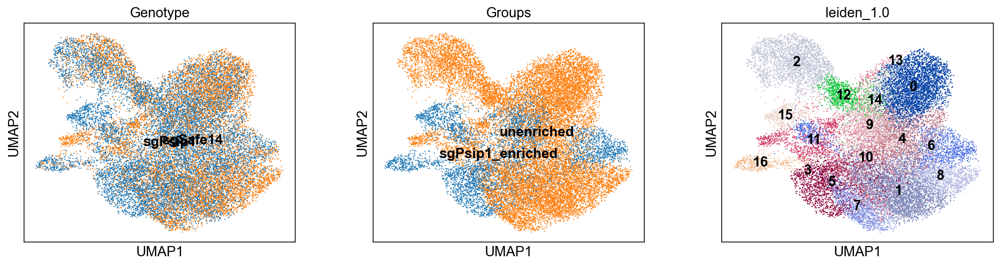

In [62]:
sc.pl.umap(adata_filt, color=['Genotype', 'Groups', 'leiden_1.0'], legend_loc = 'on data')

In [63]:
sc.tl.rank_genes_groups(adata_filt, 'Groups', Group = 'sgPsip1_enriched', reference = 'unenriched', method='wilcoxon', key_added = "cluster_wilcoxon", pts = True)

In [64]:
dedf_cluster = sc.get.rank_genes_groups_df(adata_filt, group = 'sgPsip1_enriched', key="cluster_wilcoxon")
select = dedf_cluster.loc[dedf_cluster['names'].isin(genes)]
select.sort_values('logfoldchanges')

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
33620,Kdm6a,-16.443127,-0.573871,9.394503e-61,1.587765e-58,0.486578
32563,Rasa1,-8.523079,-0.462731,1.553665e-17,3.987621e-16,0.295085
33459,Arid2,-13.901291,-0.419406,6.220877e-44,5.667873e-42,0.554820
31100,Stk11,-4.929609,-0.395566,8.239430e-07,9.412275e-06,0.164461
31950,Trp53,-6.708804,-0.361889,1.962262e-11,3.348227e-10,0.246503
33101,Chd1,-11.115090,-0.348891,1.059435e-28,4.774802e-27,0.560870
32155,Rnf43,-7.267636,-0.348193,3.658336e-13,7.030078e-12,0.327221
32952,Setd2,-10.270873,-0.326589,9.533830e-25,3.556981e-23,0.504915
32822,Ncoa6,-9.606356,-0.321406,7.516224e-22,2.440571e-20,0.428355
32458,Pten,-8.134264,-0.308799,4.144474e-16,9.803465e-15,0.376181


In [65]:
dedf_cluster.to_csv('sgPsip1_vs_sgSafe_DGE_cluster.csv')

In [66]:
# export signficant genes
dedf_cluster_sig = dedf_cluster[dedf_cluster['pvals_adj'] <= 0.01]
dedf_cluster_sig.to_csv('sgPsip1_vs_sgSafe_DGE_cluster_sig.csv')

In [67]:
# Count the number of rows above the threshold value
up_sig = len(dedf_cluster_sig[dedf_cluster_sig['logfoldchanges'] > 0])
dn_sig = len(dedf_cluster_sig[dedf_cluster_sig['logfoldchanges'] < 0])
# Print the count
print(f"Number of significantly up genes: {up_sig}")
print(f"Number of significantly down genes:: {dn_sig}")

Number of significantly up genes: 551
Number of significantly down genes:: 3951


In [68]:
dedf_cluster = dedf_cluster.sort_values(by='names')
dedf_genotype = dedf_genotype.sort_values(by='names')

In [69]:
# Calculate correlation between logFC
corr_df1_df2 = dedf_cluster['logfoldchanges'].corr(dedf_genotype['logfoldchanges'])

print(corr_df1_df2)

-0.044310622384383096


# Export MAST

# Step 1: Filter counts_df to match adata_filt cells
cells_to_keep = adata_filt.obs_names
filtered_counts_df = counts_df.loc[cells_to_keep]

# Step 2: Add metadata columns from adata_filt
filtered_counts_df = filtered_counts_df.join(
    adata_filt.obs[['cell_type', 'comp_groups', 'Groups']]
)

# Step 3: Export counts matrix (genes as rows, cells as columns)
counts_only = filtered_counts_df.drop(['sample', 'Genotype', 'cell_type', 'comp_groups', 'Groups'], axis=1)
counts_only.T.to_csv('psip1_filtered_counts_matrix.csv')

# Step 4: Export metadata
metadata = filtered_counts_df[['sample', 'Genotype', 'cell_type', 'comp_groups', 'Groups']]
metadata.to_csv('psip1_filtered_metadata.csv')

In [70]:
genes_all = list(adata_filt.var_names)
group_names = ['sgPsip1_enriched', 'sgPsip1_unenriched']

def percent_express(adata, genes, group_col, group_names):
    perc = {}
    for grp in group_names:
        mask = (adata.obs[group_col] == grp)
        data = adata[mask].to_df()[genes]
        vals = (data > 0).sum(axis=0) / data.shape[0] * 100
        perc[grp] = vals
    return pd.DataFrame(perc)

percent_df_all = percent_express(adata_filt, genes_all, 'Groups', group_names)
percent_df_all.to_csv("percent_expression_sgPsip1.csv")

# Cell Signatures

## Mouse signatures - PangDB

In [77]:
mouse_cell_sig = pd.read_csv("/Users/winslowlab-tang/Desktop/Figs_code/Fig6_code/cell_sigs/mouse/pdb_2.csv")

In [ ]:
at2_mouse = [x for x in mouse_cell_sig.Pulmonary_alveolar_type_II_cells.values.tolist() if pd.notnull(x)]

In [ ]:
sc.tl.score_genes(adata_filt, at2_mouse, score_name='at2_mouse', ctrl_size=len(at2_mouse))

# Plots

In [108]:
sc.settings.figdir = '/Volumes/G_DRIVE_SSD/Parse_WT/Analyzed_plots/sgPsip1'

## Prepare data

In [109]:
adata_filt_raw = adata_filt.raw.to_adata() # create a object with all normalized genes. This will be used for plotting

In [110]:
adata_filt_raw.X.shape

(22164, 33802)

In [111]:
adata_filt.X.shape

(22164, 4557)

In [112]:
# scale data
adata_filt_raw.layers['scaled'] = sc.pp.scale(adata_filt_raw, copy=True).X

In [113]:
adata_filt_raw.layers['scaled'].shape

(22164, 33802)

## UMAPS

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_tools/sca

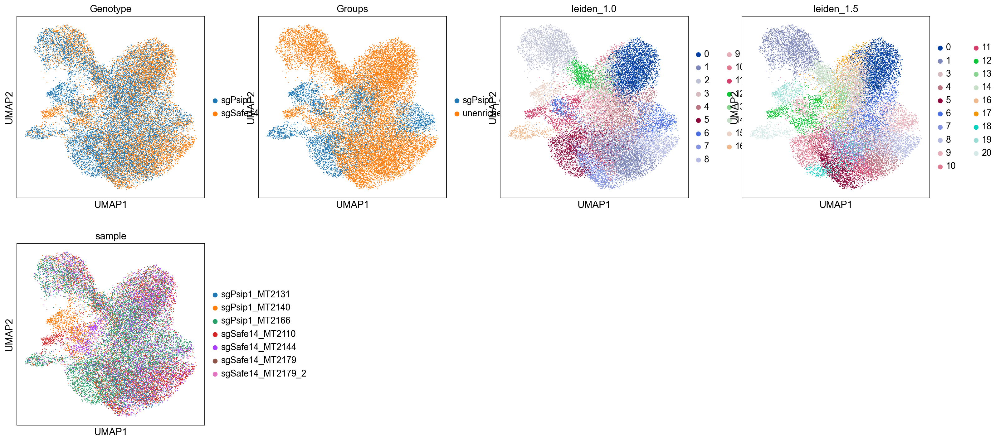

In [114]:
from matplotlib.pyplot import rc_context

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata_filt, color=['Genotype', 'Groups', 'leiden_1.0', 'leiden_1.5', 'sample'],legend_loc="right margin", save='_sgPsip1_umaps')

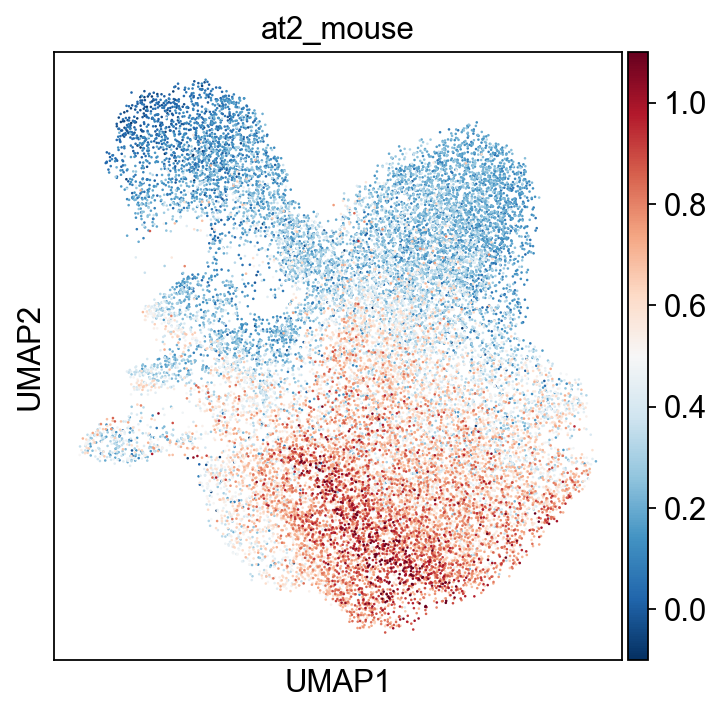

In [115]:
from matplotlib.pyplot import rc_context

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata_filt_raw, color=['at2_mouse'], cmap='RdBu_r',  vmin = -0.1, vmax = 1.1, save = '_sgPsip1_at2')

## Barplots

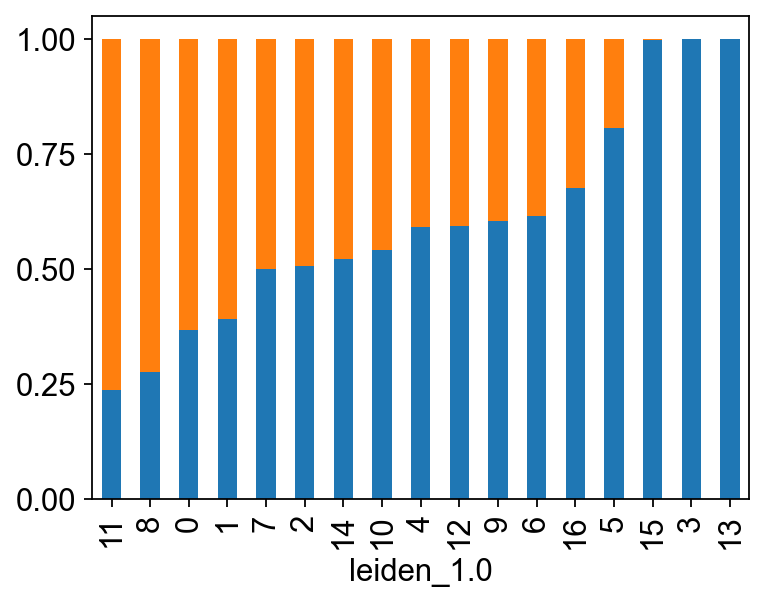

In [117]:
from matplotlib import pyplot as plt
ax = ct_norm_frac_sorted.sort_values('sgSafe14', ascending=False).plot.bar(
    stacked=True, yticks=(0, 0.25, 0.5, 0.75, 1))
ax.grid(False)         # Remove background grid
ax.legend().remove()   # Remove legend
plt.tight_layout()
plt.savefig('sgPsip1_genotype_bar.pdf')

In [118]:
# extract leiden order
cl_order = ct_norm_frac_sorted.sort_values('sgSafe14', ascending=False).index.tolist()

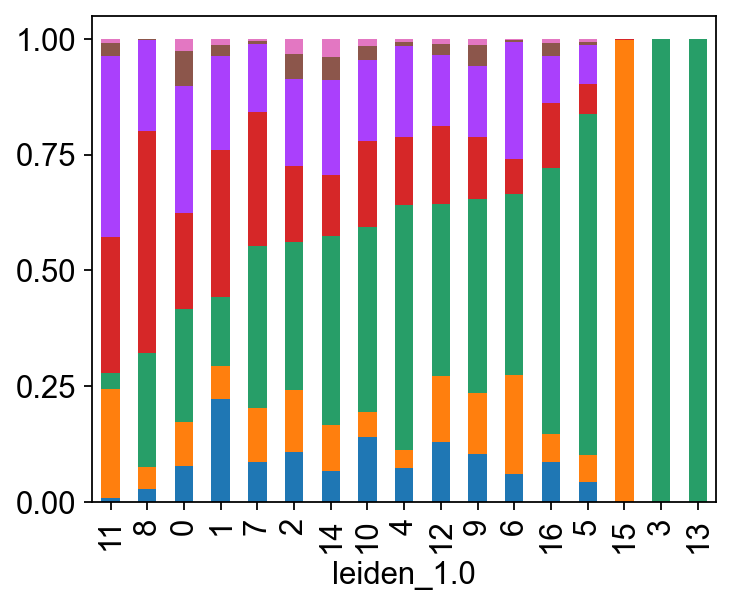

In [119]:
tmp_3 = pd.crosstab(adata_filt.obs['leiden_1.0'],adata_filt.obs['sample'], normalize='index')
# Create the plot
ax = tmp_3.reindex(index=cl_order).plot.bar(stacked=True, yticks=(0, 0.25, 0.5, 0.75, 1))
# Remove the legend
ax.legend().remove()
# Remove the grid lines
ax.grid(False)
# Save the plot
plt.savefig('sgPsip1_sample_bar.pdf')

In [149]:
tsgs = ['Cdkn2c', 'Chd1', 'Dot1l', 'Dusp5', 'Fat1', 'Fbxw7', 'Ncoa6','Nf1', 'Pten', 'Rasa1', 'Rb1', 'Setd2', 'Stk11', 'Trp53', 'Tsc1']

In [121]:
dedf_cluster = sc.get.rank_genes_groups_df(adata_filt, group = 'sgPsip1_enriched', key="cluster_wilcoxon")
select = dedf_cluster.loc[dedf_cluster['names'].isin(tsgs)]
select.sort_values('pvals_adj')

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
33101,Chd1,-11.115090,-0.348891,1.059435e-28,4.774802e-27,0.560870
33099,Dot1l,-11.097905,-0.470395,1.284185e-28,5.772345e-27,0.393573
32952,Setd2,-10.270873,-0.326589,9.533830e-25,3.556981e-23,0.504915
32822,Ncoa6,-9.606356,-0.321406,7.516224e-22,2.440571e-20,0.428355
32563,Rasa1,-8.523079,-0.462731,1.553665e-17,3.987621e-16,0.295085
32458,Pten,-8.134264,-0.308799,4.144474e-16,9.803465e-15,0.376181
32383,Nf1,-7.887048,-0.219944,3.094195e-15,6.908189e-14,0.618526
31964,Fat1,-6.744334,-0.200452,1.537306e-11,2.643134e-10,0.694518
31950,Trp53,-6.708804,-0.361889,1.962262e-11,3.348227e-10,0.246503
31886,Fbxw7,-6.542081,-0.270427,6.066871e-11,9.988913e-10,0.362949


/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


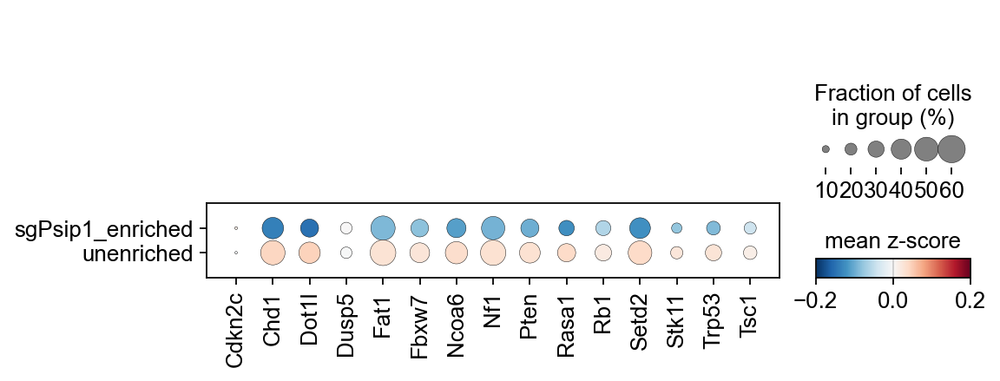

In [150]:
sc.pl.dotplot(adata_filt_raw, tsgs, 'Groups', layer='scaled',  colorbar_title='mean z-score',  vmin = -0.2, vmax = 0.2, cmap='RdBu_r',  save = 'tsg_sgPsip1')

In [126]:
at2_genes = [ 'Abca3', 'Lamp3', 'Napsa', 'Sftpa1', 'Sftpb', 'Sftpc', 'Sftpd']

/Users/winslowlab-tang/anaconda3/envs/scvelo/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


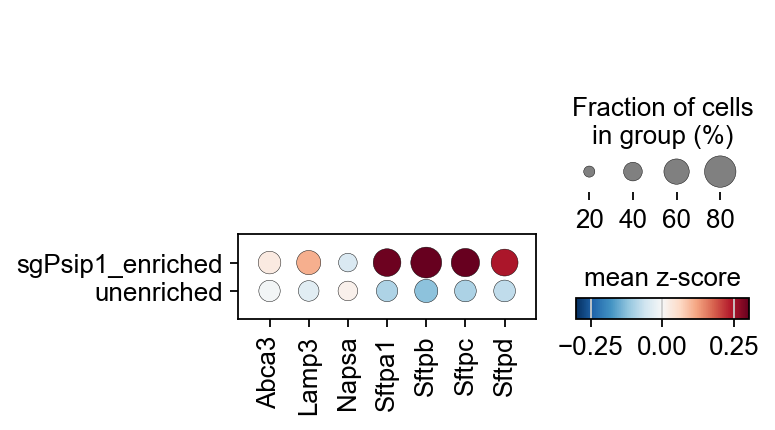

In [127]:
sc.pl.dotplot(adata_filt_raw, at2_genes, 'Groups', dendrogram = True, layer='scaled',  colorbar_title='mean z-score', vmin = -0.3, vmax = 0.3, cmap='RdBu_r', save = 'at2_sgPsip1')

# Additional analyses

In [138]:
adata_filt.obs

,sample,species,gene_count,tscp_count,mread_count,bc1_well,bc2_well,bc3_well,bc1_wind,bc2_wind,...,podo_mouse,at2_mca,acinar_mca,hepa1_mca,hepa2_mca,hepa3_mca,hepa4_mca,hepa5_mca,hepa_g,tubu_mca
04_01_15__s1,sgSafe14_MT2110,mm10,5123,29337,155214,A4,A1,B3,4,1,...,0.381337,0.284165,-0.021536,0.017152,0.259561,0.277365,0.036482,0.028854,-0.007941,0.093793
04_01_25__s1,sgSafe14_MT2110,mm10,2280,13078,70768,A4,A1,C1,4,1,...,0.088943,0.418664,0.042935,0.043449,0.138621,0.343994,0.019501,0.028541,0.010009,0.101350
04_03_65__s1,sgSafe14_MT2110,mm10,1009,1880,10292,A4,A3,F5,4,3,...,0.182829,0.588665,0.032032,0.058272,0.191162,0.552266,0.083174,0.062482,0.036034,0.159718
04_04_08__s1,sgSafe14_MT2110,mm10,3356,12789,67970,A4,A4,A8,4,4,...,0.190821,0.444834,-0.048660,0.048576,0.129577,0.298607,0.027707,0.040366,0.019113,0.135180
04_04_21__s1,sgSafe14_MT2110,mm10,3482,12879,66896,A4,A4,B9,4,4,...,0.256067,0.515094,-0.018701,0.057381,0.250590,0.243942,0.089710,0.069336,0.029427,0.126993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48_82_74__s8,sgSafe14_MT2179_2,mm10,1184,2190,13506,D12,G10,G2,48,82,...,0.410983,0.296370,-0.041150,0.030569,0.257193,0.241026,0.068840,0.037310,-0.003876,0.092252
48_82_90__s8,sgSafe14_MT2179_2,mm10,1561,3519,21917,D12,G10,H6,48,82,...,0.306762,0.329663,0.015697,0.049960,0.278874,0.259961,0.082927,0.075133,0.015975,0.099818
48_88_79__s8,sgSafe14_MT2179_2,mm10,2415,6978,42633,D12,H4,G7,48,88,...,0.247655,0.341469,-0.045136,0.016222,0.292105,0.160481,0.058417,0.055471,0.004327,0.058029
48_92_05__s8,sgSafe14_MT2179_2,mm10,2445,6680,40596,D12,H8,A5,48,92,...,0.423213,0.373696,-0.060040,0.021424,0.318080,0.169623,0.044918,0.034358,0.006068,0.113638


In [ ]:
at2_mouse = adata_filt.obs[['at2_mouse', 'Groups', 'Genotype']]

In [ ]:
import os
output_directory = "/Users/winslowlab-tang/Desktop/Figs_code/Fig6_code/cell_sigs/mouse/mouse_gene_signature_scores/Psip1"
at2_mouse.to_csv(os.path.join(output_directory, 'at2_mouse.csv'), index=True)

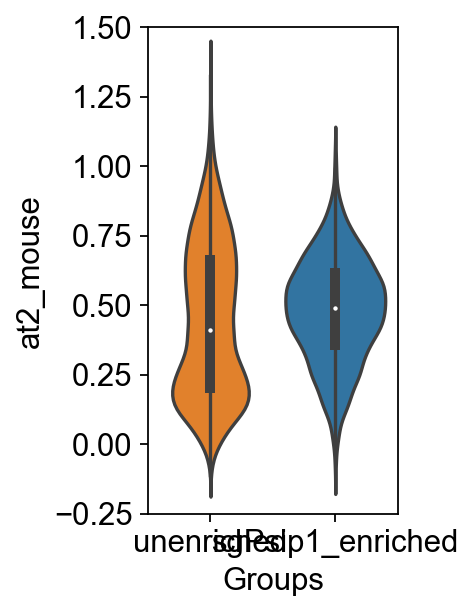

In [142]:
# Create the box plot
plt.figure(figsize=(2, 4))
sns.violinplot(x='Groups', y='at2_mouse', data=at2_mouse, order = ["unenriched", "sgPsip1_enriched"], palette=["#ff7f0e", "#1f77b4"])

# Overlay the individual data points
#sns.stripplot(x='Genotype', y='at2_full', data=data, color='black', alpha=0.5, jitter=True)

plt.ylim(-0.25, 1.5) 
# Remove grid
plt.grid(False)

# Save as PDF
plt.savefig('/Volumes/G_DRIVE_SSD/Parse_WT/Analyzed_plots/sgPsip1/at2_mouse_violin.pdf', format='pdf', bbox_inches='tight')

# Show the plot
plt.show()

## Statistical Testing

In [144]:
# Separate the data into two groups
group1 = at2_mouse[at2_mouse['Groups'] == 'unenriched']['at2_mouse']
group2 = at2_mouse[at2_mouse['Groups'] == 'sgPsip1_enriched']['at2_mouse']

# Perform the Wilcoxon rank-sum test
stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')

# Print the results
print(f"Wilcoxon rank-sum test statistic: {stat}")
print(f"P-value: {p_value}")

Wilcoxon rank-sum test statistic: 39072242.0
P-value: 1.1394930030405413e-42
